In [1]:
pip install torch torchvision transformers pandas numpy scikit-learn

  Obtaining dependency information for torchvision from https://files.pythonhosted.org/packages/29/88/00c69db213ee2443ada8886ec60789b227e06bb869d85ee324578221a7f7/torchvision-0.21.0-cp311-cp311-macosx_11_0_arm64.whl.metadata
  Obtaining dependency information for torch from https://files.pythonhosted.org/packages/0b/fa/f33a4148c6fb46ca2a3f8de39c24d473822d5774d652b66ed9b1214da5f7/torch-2.6.0-cp311-none-macosx_11_0_arm64.whl.metadata
  Obtaining dependency information for typing-extensions>=4.10.0 from https://files.pythonhosted.org/packages/26/9f/ad63fc0248c5379346306f8668cda6e2e2e9c95e01216d2b8ffd9ff037d0/typing_extensions-4.12.2-py3-none-any.whl.metadata
  Obtaining dependency information for sympy==1.13.1 from https://files.pythonhosted.org/packages/b2/fe/81695a1aa331a842b582453b605175f419fe8540355886031328089d840a/sympy-1.13.1-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66

In [2]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from transformers import BertModel, BertTokenizer
import numpy as np
from sklearn.preprocessing import StandardScaler
print("successfully loaded")

/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


successfully loaded


In [66]:
import matplotlib.pyplot as plt  # Add this import for plotting

In [29]:
# Load FashionMNIST dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to match ResNet input size
    transforms.Grayscale(num_output_channels=3),  # Convert to 3 channels for ResNet
    transforms.ToTensor(),
])

train_dataset = torchvision.datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = torchvision.datasets.FashionMNIST(root='./data', train=False, download=True, transform=transform)



In [30]:
print(f"Training dataset size: {len(train_dataset)}")

Training dataset size: 60000


In [31]:
print(f"Test dataset size: {len(test_dataset)}")

Test dataset size: 10000


In [32]:
print(f"Number of classes: {len(train_dataset.classes)}")

Number of classes: 10


In [33]:
print(f"Sample image shape: {train_dataset[0][0].shape}")

Sample image shape: torch.Size([3, 224, 224])


In [11]:
# Generate synthetic text data
def generate_text_labels(labels):
    fashion_items = [
        "T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
        "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"
    ]
    return [f"This is a {fashion_items[label]}" for label in labels]

# Generate synthetic numerical data
def generate_numerical_data(size):
    return np.random.rand(size, 2)  # 2-dimensional numerical data


In [34]:
def generate_text_labels(labels):
    fashion_items = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
    return [f"This is a {fashion_items[label]}" for label in labels]

In [35]:
def generate_numerical_data(size):
    return np.random.rand(size, 2)

In [36]:
train_text = generate_text_labels(train_dataset.targets.numpy())

In [37]:
train_text

['This is a Ankle boot',
 'This is a T-shirt/top',
 'This is a T-shirt/top',
 'This is a Dress',
 'This is a T-shirt/top',
 'This is a Pullover',
 'This is a Sneaker',
 'This is a Pullover',
 'This is a Sandal',
 'This is a Sandal',
 'This is a T-shirt/top',
 'This is a Ankle boot',
 'This is a Sandal',
 'This is a Sandal',
 'This is a Sneaker',
 'This is a Ankle boot',
 'This is a Trouser',
 'This is a T-shirt/top',
 'This is a Shirt',
 'This is a Coat',
 'This is a Dress',
 'This is a Trouser',
 'This is a Coat',
 'This is a Bag',
 'This is a Coat',
 'This is a Dress',
 'This is a T-shirt/top',
 'This is a Pullover',
 'This is a Coat',
 'This is a Coat',
 'This is a Sandal',
 'This is a Dress',
 'This is a Shirt',
 'This is a Shirt',
 'This is a T-shirt/top',
 'This is a Bag',
 'This is a Sandal',
 'This is a Pullover',
 'This is a Trouser',
 'This is a Shirt',
 'This is a Shirt',
 'This is a Sneaker',
 'This is a Ankle boot',
 'This is a Sandal',
 'This is a Ankle boot',
 'This is a

In [38]:
train_numerical = generate_numerical_data(len(train_dataset))

In [39]:
train_numerical

array([[0.47655171, 0.94790671],
       [0.8792016 , 0.64146857],
       [0.20115718, 0.17549953],
       ...,
       [0.07042669, 0.89285966],
       [0.94869535, 0.61035342],
       [0.93688763, 0.04758012]])

In [40]:
test_text = generate_text_labels(test_dataset.targets.numpy())

In [42]:
test_text

['This is a Ankle boot',
 'This is a Pullover',
 'This is a Trouser',
 'This is a Trouser',
 'This is a Shirt',
 'This is a Trouser',
 'This is a Coat',
 'This is a Shirt',
 'This is a Sandal',
 'This is a Sneaker',
 'This is a Coat',
 'This is a Sandal',
 'This is a Sneaker',
 'This is a Dress',
 'This is a Coat',
 'This is a Trouser',
 'This is a Pullover',
 'This is a Coat',
 'This is a Bag',
 'This is a T-shirt/top',
 'This is a Pullover',
 'This is a Sandal',
 'This is a Sneaker',
 'This is a Ankle boot',
 'This is a Trouser',
 'This is a Coat',
 'This is a Shirt',
 'This is a T-shirt/top',
 'This is a Ankle boot',
 'This is a Dress',
 'This is a Bag',
 'This is a Bag',
 'This is a Dress',
 'This is a Dress',
 'This is a Bag',
 'This is a T-shirt/top',
 'This is a Sneaker',
 'This is a Sandal',
 'This is a Sneaker',
 'This is a Ankle boot',
 'This is a Shirt',
 'This is a Trouser',
 'This is a Dress',
 'This is a Sneaker',
 'This is a Shirt',
 'This is a Sneaker',
 'This is a Pull

In [43]:
test_numerical = generate_numerical_data(len(test_dataset))

In [44]:
test_numerical

array([[0.02213543, 0.18305268],
       [0.80123048, 0.37814922],
       [0.46942363, 0.04165427],
       ...,
       [0.2302209 , 0.76432743],
       [0.36478786, 0.39093386],
       [0.67874793, 0.54536535]])

In [45]:
print(f"Sample text: {train_text[0]}")

Sample text: This is a Ankle boot


In [46]:
print(f"Sample numerical data: {train_numerical[0]}")

Sample numerical data: [0.47655171 0.94790671]


In [81]:
class MultiModalDataset(Dataset):
    def __init__(self, image_dataset, text_data, numerical_data, tokenizer, max_length):
        self.image_dataset = image_dataset
        self.text_data = text_data
        self.numerical_data = numerical_data
        self.tokenizer = tokenizer
        self.max_length = max_length
        self.scaler = StandardScaler()
        self.numerical_data = self.scaler.fit_transform(numerical_data)
        
        # Debug print statement to check initialization
        print(f"Dataset initialized with {len(self.image_dataset)} samples.")
    
    def __len__(self):
        return len(self.image_dataset)
    
    def __getitem__(self, idx):
        image, label = self.image_dataset[idx]
        text = self.text_data[idx]
        numerical = self.numerical_data[idx]
        
        # Tokenize text
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )
        
        # Print input shapes for the first sample
        if idx == 0:
            print(f"\nInput shapes for sample {idx}:")
            print(f"Text input IDs: {encoding['input_ids'].shape}")
            print(f"Text attention mask: {encoding['attention_mask'].shape}")
            print(f"Image shape: {image.shape}")
            print(f"Numerical data shape: {numerical.shape}")
        
        return {
            'text': {
                'input_ids': encoding['input_ids'].flatten(),
                'attention_mask': encoding['attention_mask'].flatten()
            },
            'image': image,
            'numerical': torch.tensor(numerical, dtype=torch.float),
            'label': label
        }

In [49]:
    def __len__(self):
        return len(self.image_dataset)

In [70]:
    def __getitem__(self, idx):
        image, label = self.image_dataset[idx]
        text = self.text_data[idx]
        numerical = self.numerical_data[idx]
        
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            return_token_type_ids=False,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )
        
        if idx == 0:
            print(f"\nInput shapes for sample {idx}:")
            print(f"Text input IDs: {encoding['input_ids'].shape}")
            print(f"Text attention mask: {encoding['attention_mask'].shape}")
            print(f"Image shape: {image.shape}")
            print(f"Numerical data shape: {numerical.shape}")
        
        return {
            'text': {
                'input_ids': encoding['input_ids'].flatten(),
                'attention_mask': encoding['attention_mask'].flatten()
            },
            'image': image,
            'numerical': torch.tensor(numerical, dtype=torch.float),
            'label': label
        }

In [82]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

In [83]:
train_multi_dataset = MultiModalDataset(train_dataset, train_text, train_numerical, tokenizer, max_length=128)

Dataset initialized with 60000 samples.


In [84]:
test_multi_dataset = MultiModalDataset(test_dataset, test_text, test_numerical, tokenizer, max_length=128)

Dataset initialized with 10000 samples.


In [85]:
sample = train_multi_dataset[0]


Input shapes for sample 0:
Text input IDs: torch.Size([1, 128])
Text attention mask: torch.Size([1, 128])
Image shape: torch.Size([3, 224, 224])
Numerical data shape: (2,)


In [86]:
print(f"Sample numerical data: {sample['numerical']}")

Sample numerical data: tensor([-0.0824,  1.5517])


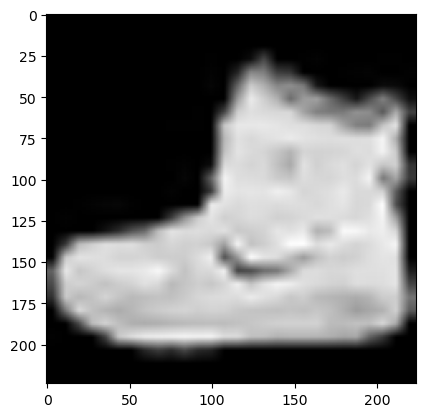

In [87]:
plt.imshow(sample['image'].permute(1, 2, 0).squeeze(), cmap='gray')

Text(0.5, 1.0, 'Label: 9')

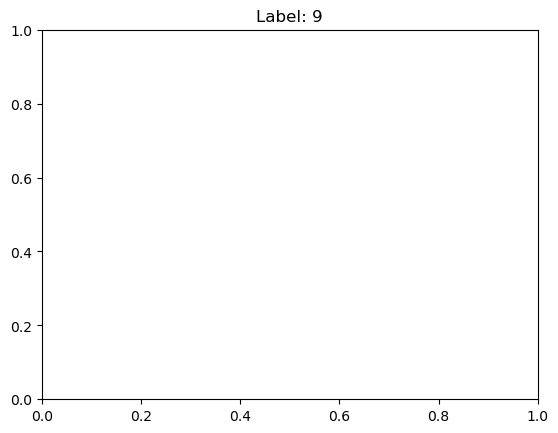

In [88]:
plt.title(f"Label: {sample['label']}")

In [89]:
plt.show()

In [90]:
# Print dataset information after initialization
print(f"Training dataset size: {len(train_multi_dataset)}")
print(f"Test dataset size: {len(test_multi_dataset)}")

Training dataset size: 60000
Test dataset size: 10000


In [91]:
# Test the dataset
sample = train_multi_dataset[0]

# Print sample data
print(f"Sample text input IDs: {sample['text']['input_ids']}")
print(f"Sample text attention mask: {sample['text']['attention_mask']}")
print(f"Sample image shape: {sample['image'].shape}")
print(f"Sample numerical data: {sample['numerical']}")
print(f"Sample label: {sample['label']}")


Input shapes for sample 0:
Text input IDs: torch.Size([1, 128])
Text attention mask: torch.Size([1, 128])
Image shape: torch.Size([3, 224, 224])
Numerical data shape: (2,)
Sample text input IDs: tensor([  101,  2023,  2003,  1037, 10792,  9573,   102,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,   

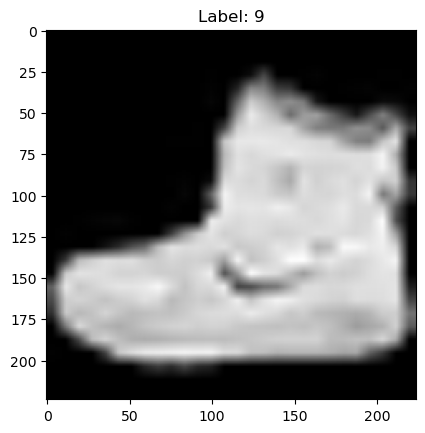

In [92]:
# Visualize the sample image
plt.imshow(sample['image'].permute(1, 2, 0).squeeze(), cmap='gray')
plt.title(f"Label: {sample['label']}")
plt.show()

In [93]:
# Create DataLoaders
batch_size = 32

train_loader = DataLoader(train_multi_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_multi_dataset, batch_size=batch_size, shuffle=False)

print(f"Training DataLoader size: {len(train_loader)} batches")
print(f"Test DataLoader size: {len(test_loader)} batches")

Training DataLoader size: 1875 batches
Test DataLoader size: 313 batches


In [94]:
class MultiModalModel(nn.Module):
    def __init__(self, num_classes):
        super(MultiModalModel, self).__init__()
        
        # Image branch (using a pre-trained ResNet18)
        self.image_branch = torchvision.models.resnet18(pretrained=True)
        self.image_branch.fc = nn.Linear(self.image_branch.fc.in_features, 128)  # Reduce to 128 features
        
        # Text branch (using BERT)
        self.text_branch = BertModel.from_pretrained('bert-base-uncased')
        self.text_projection = nn.Linear(768, 128)  # Reduce BERT output to 128 features
        
        # Numerical branch
        self.numerical_branch = nn.Sequential(
            nn.Linear(2, 64),  # 2D numerical data
            nn.ReLU(),
            nn.Linear(64, 128)  # Reduce to 128 features
        )
        
        # Combined features
        self.combined_fc = nn.Sequential(
            nn.Linear(128 * 3, 256),  # Combine image, text, and numerical features
            nn.ReLU(),
            nn.Linear(256, num_classes)  # Final classification layer
        )
    
    def forward(self, image, text_input_ids, text_attention_mask, numerical):
        # Image branch
        image_features = self.image_branch(image)
        
        # Text branch
        text_outputs = self.text_branch(input_ids=text_input_ids, attention_mask=text_attention_mask)
        text_features = text_outputs.last_hidden_state[:, 0, :]  # Use the [CLS] token
        text_features = self.text_projection(text_features)
        
        # Numerical branch
        numerical_features = self.numerical_branch(numerical)
        
        # Combine features
        combined_features = torch.cat([image_features, text_features, numerical_features], dim=1)
        output = self.combined_fc(combined_features)
        
        return output

In [95]:
# Initialize the model
num_classes = 10  # FashionMNIST has 10 classes
model = MultiModalModel(num_classes)

# Print the model architecture
print(model)

/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /Users/cazandraaporbo/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████████████████████████████████| 44.7M/44.7M [00:00<00:00, 60.4MB/s]


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


MultiModalModel(
  (image_branch): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tr

In [96]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

print("Loss function and optimizer defined.")

Loss function and optimizer defined.


In [99]:
# Train the model for one epoch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.train()
for batch_idx, batch in enumerate(train_loader):
    # Move data to device
    image = batch['image'].to(device)
    text_input_ids = batch['text']['input_ids'].to(device)
    text_attention_mask = batch['text']['attention_mask'].to(device)
    numerical = batch['numerical'].to(device)
    labels = batch['label'].to(device)
    
    # Forward pass
    outputs = model(image, text_input_ids, text_attention_mask, numerical)
    loss = criterion(outputs, labels)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Print progress
    if batch_idx % 100 == 0:
        print(f"Batch {batch_idx}/{len(train_loader)} - Loss: {loss.item():.4f}")

print("Training complete!")

Batch 0/1875 - Loss: 0.2592
Batch 100/1875 - Loss: 0.7253
Batch 200/1875 - Loss: 0.3097

Input shapes for sample 0:
Text input IDs: torch.Size([1, 128])
Text attention mask: torch.Size([1, 128])
Image shape: torch.Size([3, 224, 224])
Numerical data shape: (2,)
Batch 300/1875 - Loss: 0.2458
Batch 400/1875 - Loss: 0.4856
Batch 500/1875 - Loss: 0.5145
Batch 600/1875 - Loss: 0.4115
Batch 700/1875 - Loss: 0.2202
Batch 800/1875 - Loss: 0.7279
Batch 900/1875 - Loss: 0.3759
Batch 1000/1875 - Loss: 0.3731
Batch 1100/1875 - Loss: 0.4779
Batch 1200/1875 - Loss: 0.1719
Batch 1300/1875 - Loss: 0.3615
Batch 1400/1875 - Loss: 0.1032
Batch 1500/1875 - Loss: 0.5985
Batch 1600/1875 - Loss: 0.2634
Batch 1700/1875 - Loss: 0.3820
Batch 1800/1875 - Loss: 0.3022
Training complete!


In [100]:
# Test the model
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for batch in test_loader:
        # Move data to device
        image = batch['image'].to(device)
        text_input_ids = batch['text']['input_ids'].to(device)
        text_attention_mask = batch['text']['attention_mask'].to(device)
        numerical = batch['numerical'].to(device)
        labels = batch['label'].to(device)
        
        # Forward pass
        outputs = model(image, text_input_ids, text_attention_mask, numerical)
        _, predicted = torch.max(outputs.data, 1)
        
        # Update accuracy
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"Test Accuracy: {100 * correct / total:.2f}%")


Input shapes for sample 0:
Text input IDs: torch.Size([1, 128])
Text attention mask: torch.Size([1, 128])
Image shape: torch.Size([3, 224, 224])
Numerical data shape: (2,)
Test Accuracy: 90.80%


In [101]:
torch.save

<function torch.serialization.save(obj: object, f: Union[str, os.PathLike, BinaryIO, IO[bytes]], pickle_module: Any = <module 'pickle' from '/Users/cazandraaporbo/anaconda3/lib/python3.11/pickle.py'>, pickle_protocol: int = 2, _use_new_zipfile_serialization: bool = True, _disable_byteorder_record: bool = False) -> None>

In [ ]:
##Visualizations

In [102]:
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

# Set color palette
colors = ["#FF69B4", "#32CD32", "#800080", "#00CED1"]  # Pink, Green, Purple, Mint Green
sns.set_palette(sns.color_palette(colors))

/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning: 
The palette list has fewer values (4) than needed (10) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1507: UserWarning: 
The palette list has fewer values (4) than needed (10) and will cycle, which may produce an uninterpretable plot.
  func(x=vector, **plot_kwargs)
/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1609: UserWarning: 
The palette list has fewer values (4) than needed (10) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:1609: UserWarning: 
The palette list has fewer values (4) than needed (10) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)


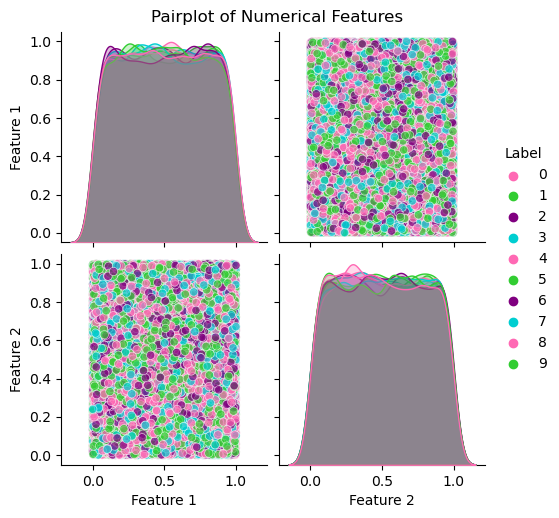

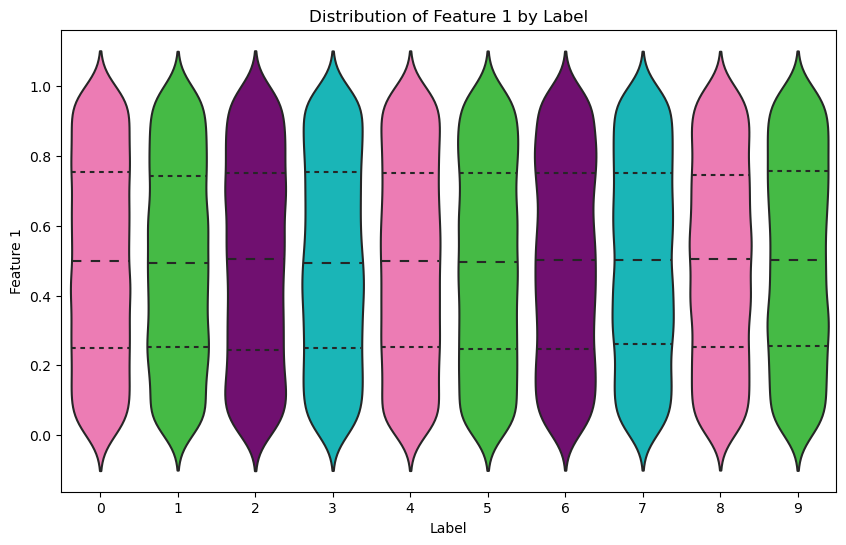

In [103]:
# Convert numerical data to a DataFrame for visualization
import pandas as pd

numerical_df = pd.DataFrame(train_numerical, columns=["Feature 1", "Feature 2"])
numerical_df["Label"] = train_dataset.targets.numpy()

# Pairplot to visualize relationships between numerical features
sns.pairplot(numerical_df, hue="Label", palette=colors, plot_kws={"alpha": 0.7})
plt.suptitle("Pairplot of Numerical Features", y=1.02)
plt.show()

# Violin plot to visualize distribution of numerical features
plt.figure(figsize=(10, 6))
sns.violinplot(x="Label", y="Feature 1", data=numerical_df, palette=colors, inner="quartile")
plt.title("Distribution of Feature 1 by Label")
plt.show()

In [104]:
from wordcloud import WordCloud

# Combine all text data into a single string
all_text = " ".join(train_text)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color="white", colormap="viridis").generate(all_text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud of Text Data", fontsize=16)
plt.show()

# Bar plot of text lengths
text_lengths = [len(text.split()) for text in train_text]
plt.figure(figsize=(10, 6))
sns.histplot(text_lengths, bins=30, color=colors[0], kde=True)
plt.title("Distribution of Text Lengths", fontsize=16)
plt.xlabel("Text Length")
plt.ylabel("Frequency")
plt.show()

ImportError: dlopen(/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/wordcloud/query_integral_image.cpython-311-darwin.so, 0x0002): tried: '/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/wordcloud/query_integral_image.cpython-311-darwin.so' (mach-o file, but is an incompatible architecture (have 'x86_64', need 'arm64e' or 'arm64')), '/System/Volumes/Preboot/Cryptexes/OS/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/wordcloud/query_integral_image.cpython-311-darwin.so' (no such file), '/Users/cazandraaporbo/anaconda3/lib/python3.11/site-packages/wordcloud/query_integral_image.cpython-311-darwin.so' (mach-o file, but is an incompatible architecture (have 'x86_64', need 'arm64e' or 'arm64'))


Input shapes for sample 0:
Text input IDs: torch.Size([1, 128])
Text attention mask: torch.Size([1, 128])
Image shape: torch.Size([3, 224, 224])
Numerical data shape: (2,)


/var/folders/29/gn_9k02539515njtq6v8rrlm0000gn/T/ipykernel_16190/2066045647.py:20: UserWarning: 
The palette list has fewer values (4) than needed (10) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x=image_tsne[:, 0], y=image_tsne[:, 1], hue=train_dataset.targets.numpy(), palette=colors, alpha=0.7)


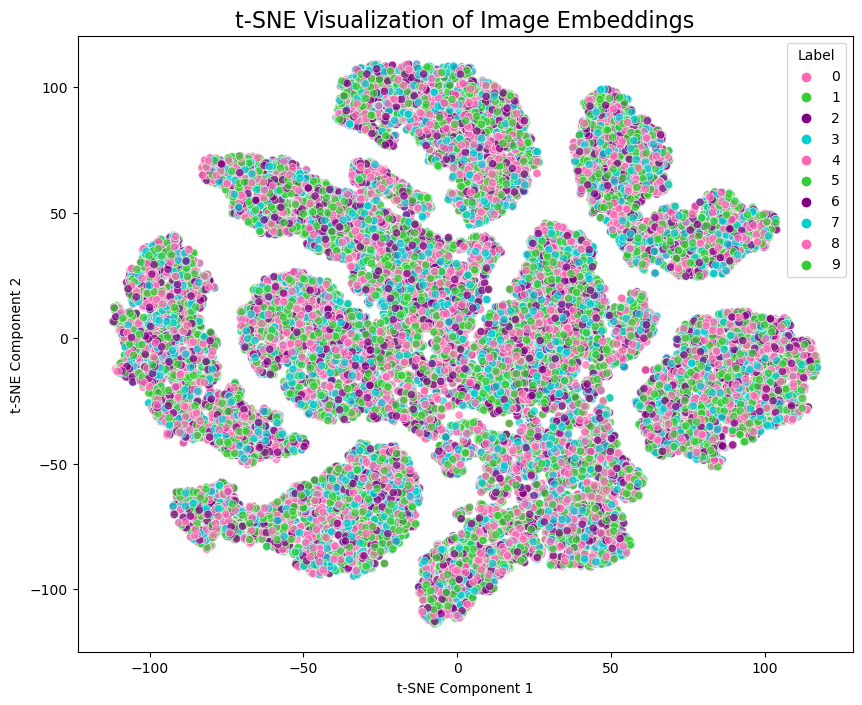

In [105]:
from sklearn.manifold import TSNE

# Extract image embeddings using the image branch of the model
model.eval()
image_embeddings = []
with torch.no_grad():
    for batch in train_loader:
        image = batch['image'].to(device)
        embeddings = model.image_branch(image).cpu().numpy()
        image_embeddings.append(embeddings)

image_embeddings = np.concatenate(image_embeddings, axis=0)

# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=42)
image_tsne = tsne.fit_transform(image_embeddings)

# Plot t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(x=image_tsne[:, 0], y=image_tsne[:, 1], hue=train_dataset.targets.numpy(), palette=colors, alpha=0.7)
plt.title("t-SNE Visualization of Image Embeddings", fontsize=16)
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Label")
plt.show()

In [106]:
# Create a 3D scatter plot of numerical data
fig = px.scatter_3d(
    numerical_df,
    x="Feature 1",
    y="Feature 2",
    z="Label",
    color="Label",
    color_continuous_scale=colors,
    title="3D Scatter Plot of Numerical Data",
    labels={"Feature 1": "Feature 1", "Feature 2": "Feature 2", "Label": "Label"},
    opacity=0.7,
)

fig.update_layout(
    scene=dict(
        xaxis_title="Feature 1",
        yaxis_title="Feature 2",
        zaxis_title="Label",
    ),
    margin=dict(l=0, r=0, b=0, t=30),
)

fig.show()

In [ ]:
# Create a parallel coordinates plot
fig = px.parallel_coordinates(
    numerical_df,
    color="Label",
    color_continuous_scale=colors,
    title="Parallel Coordinates Plot of Numerical Data",
    labels={"Feature 1": "Feature 1", "Feature 2": "Feature 2", "Label": "Label"},
)

fig.show()

In [12]:
# Add synthetic text and numerical data to the dataset
train_text = generate_text_labels(train_dataset.targets.numpy())
train_numerical = generate_numerical_data(len(train_dataset))

test_text = generate_text_labels(test_dataset.targets.numpy())
test_numerical = generate_numerical_data(len(test_dataset))

# Print sample data
print(f"Sample text: {train_text[0]}")
print(f"Sample numerical data: {train_numerical[0]}")

Sample text: This is a Ankle boot
Sample numerical data: [0.66925701 0.00517012]


In [25]:
# Initialize tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Create multi-modal datasets
train_multi_dataset = MultiModalDataset(train_dataset, train_text, train_numerical, tokenizer, max_length=128)
test_multi_dataset = MultiModalDataset(test_dataset, test_text, test_numerical, tokenizer, max_length=128)

# Print dataset information after initialization
print(f"Training dataset size: {len(train_multi_dataset)}")
print(f"Test dataset size: {len(test_multi_dataset)}")

Dataset initialized with 60000 samples.
Dataset initialized with 10000 samples.
Training dataset size: 60000
Test dataset size: 10000
